# Stable Diffusion with various models

In [4]:
!pip install GPUtil
!pip install -Uq diffusers transformers fastcore

  Preparing metadata (setup.py) ... done
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7393 sha256=57a963981ea02261fb01f8094b70a7f026b6deb5128f1266c4676713fc6aec1b
  Stored in directory: /root/.cache/pip/wheels/a9/8a/bd/81082387151853ab8b6b3ef33426e98f5cbfebc3c397a9d4d0
Successfully built GPUtil


In [5]:
import logging
from pathlib import Path
import gc
import matplotlib.pyplot as plt
import torch
from tqdm.auto import tqdm
from diffusers import StableDiffusionPipeline
from diffusers import DiffusionPipeline
import GPUtil
from huggingface_hub import notebook_login
from PIL import Image
logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

2024-02-18 19:13:36.523801: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-18 19:13:36.523901: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-18 19:13:36.646574: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [6]:
def cleanup():
    gc.collect()
    torch.cuda.empty_cache()
    
def memuse():
    GPUtil.showUtilization()


### Stable Diffusion Pipeline

In [4]:
firstpipe = DiffusionPipeline.from_pretrained("SG161222/RealVisXL_V4.0", variant="fp16", torch_dtype=torch.float16).to("cuda")

model_index.json:   0%|          | 0.00/577 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/474 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/602 [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [5]:
memuse()

| ID | GPU | MEM |
------------------
|  0 |  0% | 46% |
|  1 |  0% |  0% |


In [ ]:
# secondpipe = DiffusionPipeline.from_pretrained("SG161222/Realistic_Vision_V5.1_noVAE", torch_dtype=torch.float16).to("cuda")


In [ ]:
cleanup()

In [ ]:
from diffusers import DDPMPipeline, DDIMPipeline, PNDMPipeline

In [ ]:
#third pipeline test
model_id = "google/ddpm-cifar10-32"
ddpm = DDPMPipeline.from_pretrained(model_id)
image = ddpm().images[0]
image



# thirdpipe = DiffusionPipeline.from_pretrained("latent-consistency/lcm-lora-sdv1-5", variant="fp16", torch_dtype=torch.float16).to("cuda")

In [6]:
!ls ~/.cache/huggingface/hub

models--SG161222--RealVisXL_V4.0  version.txt  version_diffusers_cache.txt


In [7]:
firstpipe.enable_attention_slicing() #small optimization to save some memory by splitting input tensor into slices
from fastcore.all import concat

In [8]:
prompt = "a dark haired woman posing as a model on streets of Italy, vibrant color 4k background, photorealistic"

  0%|          | 0/50 [00:00<?, ?it/s]

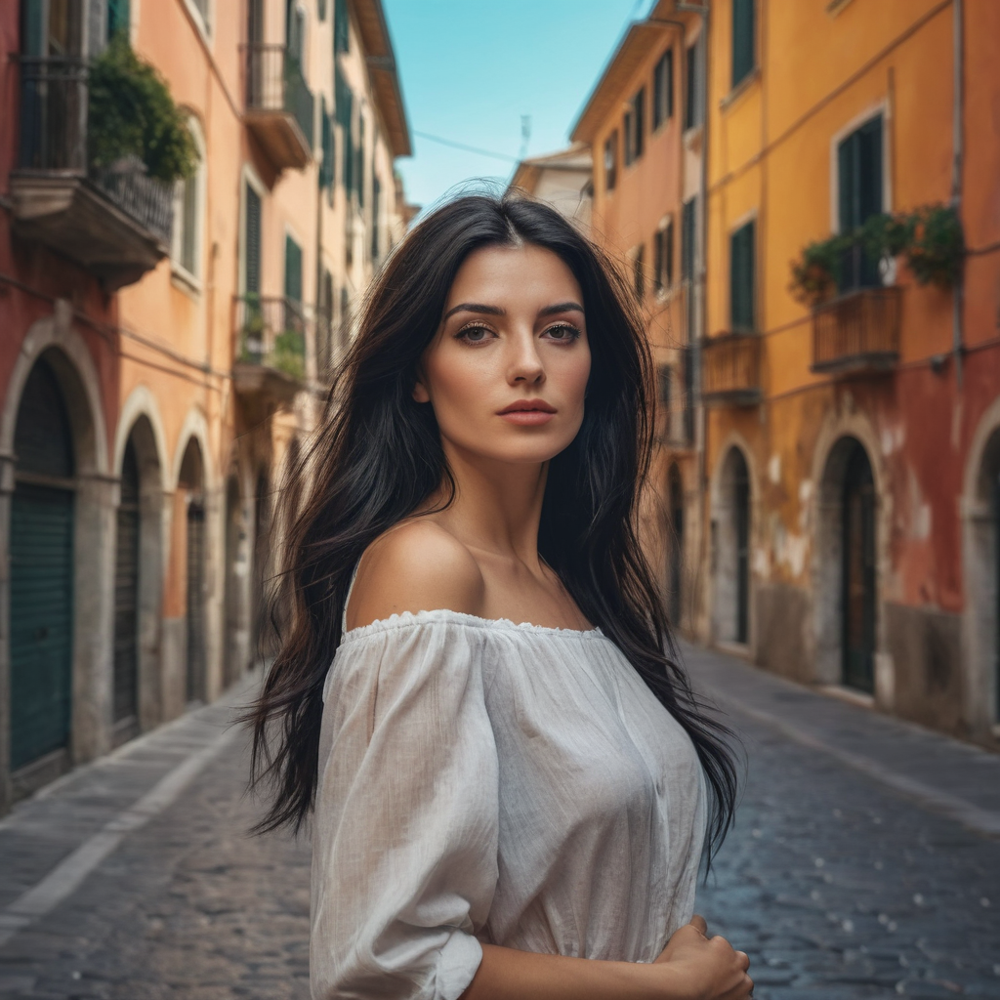

In [9]:
torch.manual_seed(1024)
image = firstpipe(prompt).images[0]
# image.save("firstpipelineimage.png")
image

In [10]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid




 This [blog post](https://benanne.github.io/2022/05/26/guidance.html) talks in more detail about Classifier-Free Guidance. 

We can generate multiple images for the same prompt by simply passing a list of prompts instead of a string but as we're working with
a large model, I'm going to do it one image at a time

In [11]:
num_rows,num_cols = 1,1
prompts = [prompt] * num_cols

In [27]:
cleanup()

In [28]:
memuse()

| ID | GPU | MEM |
------------------
|  0 |  0% | 65% |
|  1 |  0% |  0% |


In [ ]:
# with torch.no_grad():
#     torch.cuda.empty_cache

In [ ]:
memuse()

In [14]:
%time images = concat(firstpipe(prompts, guidance_scale=g).images for g in [5])

  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 34.2 s, sys: 20.4 s, total: 54.6 s
Wall time: 54.5 s


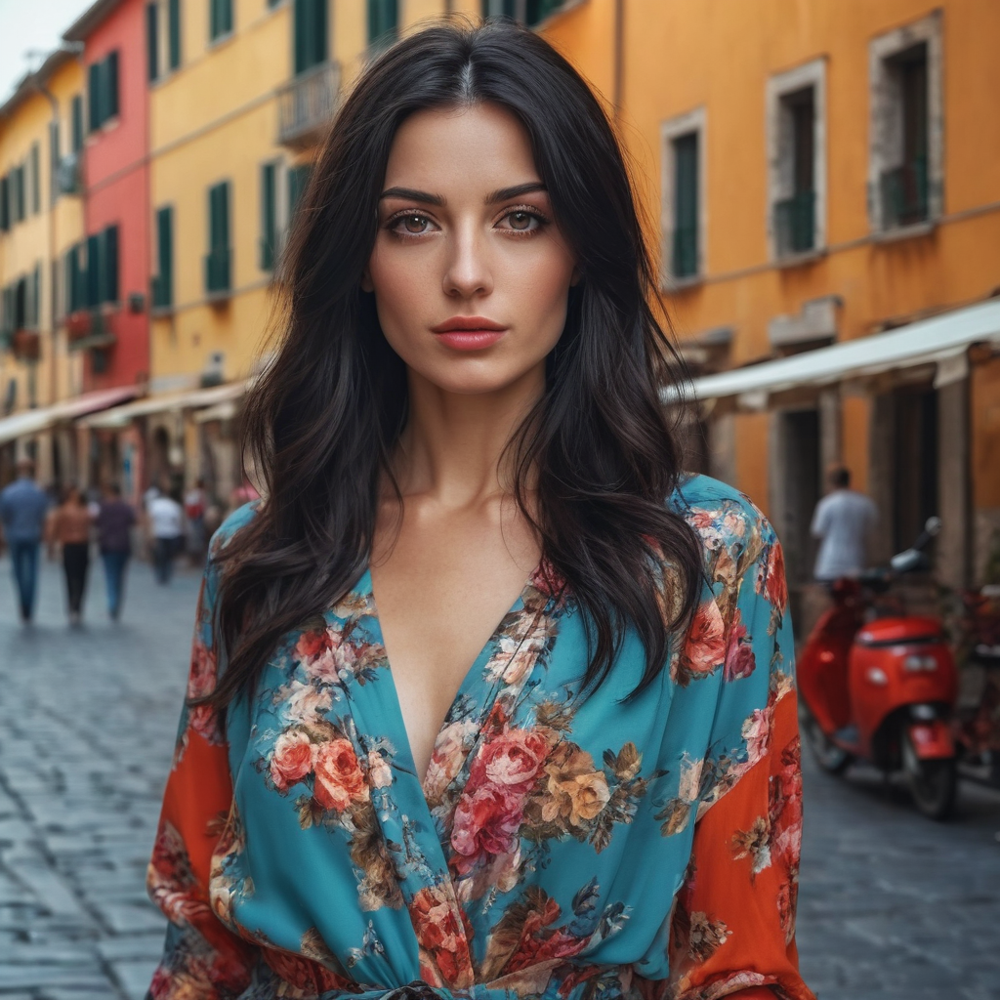

In [15]:
image_grid(images, rows=num_rows, cols=num_cols)

### Negative prompts

In [ ]:
# torch.manual_seed(1024)
# prompt = "a dark haired woman posing as a model on streets of Italy, vibrant color background, photorealistic"
# firstpipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

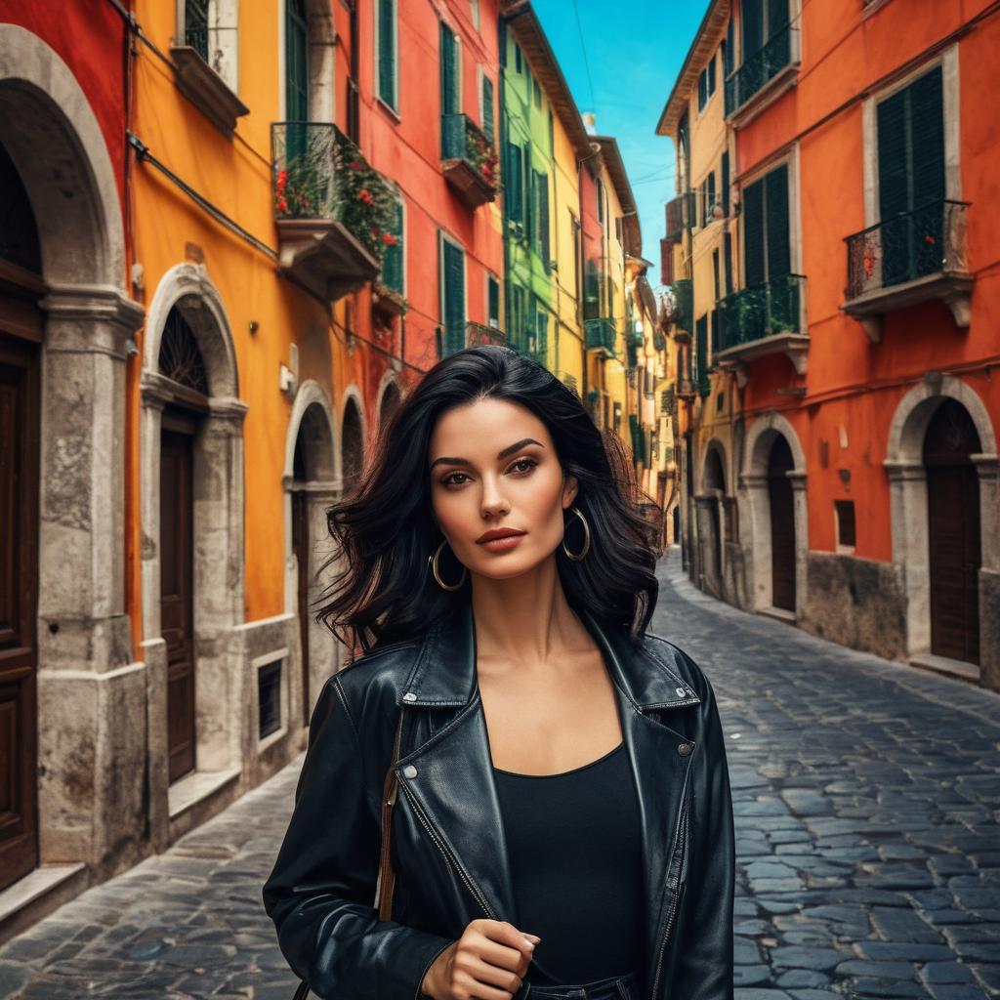

In [18]:
prompt = "a dark haired woman posing as a model on streets of Italy,vibrant color background, photorealistic"
torch.manual_seed(1000)
firstpipe(prompt, negative_prompt="deformed eyes, blur background, white").images[0]

In [19]:
!nvidia-smi

Sun Feb 18 18:40:53 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P0              30W /  70W |  12785MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

### Image to Image

In [23]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

In [24]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    variant="fp16",
    torch_dtype=torch.float16,
).to("cuda")

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

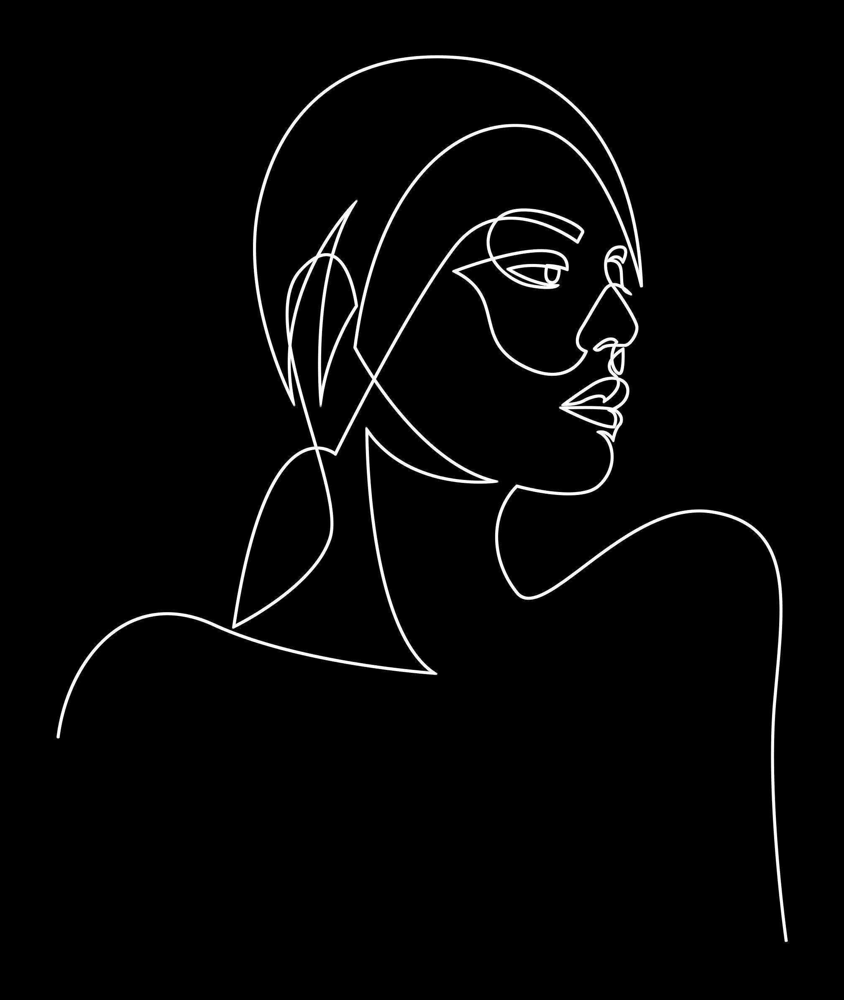

In [25]:
p = FastDownload().download('https://i.pinimg.com/originals/90/e4/b7/90e4b7ed6a7d9cd371db315d9ef5ae92.jpg')
init_image = Image.open(p).convert("RGB")
init_image

  0%|          | 0/50 [00:00<?, ?it/s]

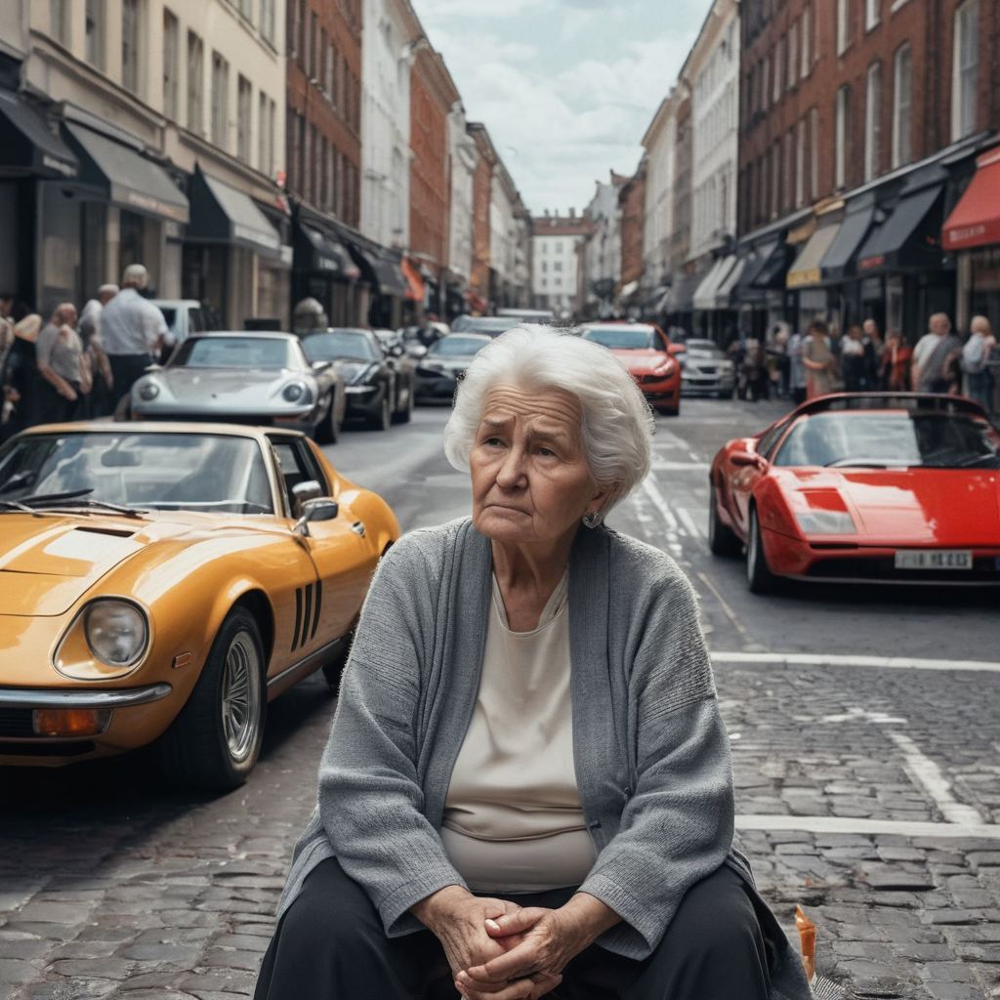

In [26]:
torch.manual_seed(1000)
prompt = "Old Woman thinking about life in middle of busy street with a 4K background of sports cars"
images = firstpipe(prompt=prompt, negative_prompt="deformed eyes,blur background", num_images_per_prompt=1, image=init_image, strength=0.8, num_inference_steps=50).images
image_grid(images, rows=1, cols=1)

In [ ]:
# torch.manual_seed(1000)
# prompt = "Black and white image of Old Woman thinking about life in middle of busy street with 4K background of sports cars"
# images = pipe(prompt=prompt, num_images_per_prompt=1, image=init_image, strength=1, num_inference_steps=50).images
# image_grid(images, rows=1, cols=1)

### Textual Inversion

Learning new tokens through a small number of images, [authors of the paper](https://textual-inversion.github.io).



![Textual Inversion diagram](https://textual-inversion.github.io/static/images/training/training.JPG)

---

In [29]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", variant="fp16", torch_dtype=torch.float16) 
pipe = pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [30]:
embeds_url = "https://huggingface.co/sd-concepts-library/indian-watercolor-portraits/resolve/main/learned_embeds.bin"
embeds_path = FastDownload().download(embeds_url)
embeds_dict = torch.load(str(embeds_path), map_location="cpu")

Add the new embedding to model so encoder knows it.

In [31]:
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
new_token, embeds = next(iter(embeds_dict.items()))
embeds = embeds.to(text_encoder.dtype)
new_token

'<watercolor-portrait>'

We add the new token to the tokenizer and the trained embeddings to the embeddings table.

In [32]:
text_encoder.resize_token_embeddings(len(tokenizer))
new_token_id = tokenizer.convert_tokens_to_ids(new_token)
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

In [ ]:
torch.manual_seed(1000)
image = pipe("Man posing as a model in the style of <watercolor-portrait>").images[0]
image

## Custom experimental pipeline

In [8]:
from transformers import CLIPTextModel, CLIPTokenizer

In [9]:
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to("cuda")

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

In [11]:
from diffusers import AutoencoderKL, UNet2DConditionModel

In [12]:
# can experiment with other VAEs and denoising networks
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema", torch_dtype=torch.float16).to("cuda")
unet = UNet2DConditionModel.from_pretrained("SG161222/Realistic_Vision_V6.0_B1_noVAE", subfolder="unet", torch_dtype=torch.float16).to("cuda")

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.78k [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

In [14]:
cleanup()

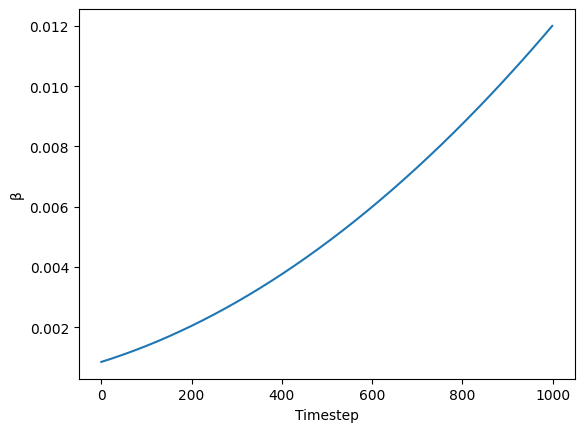

In [15]:
beta_start,beta_end = 0.00085,0.012
plt.plot(torch.linspace(beta_start**0.5, beta_end**0.5, 1000) ** 2)
plt.xlabel('Timestep')
plt.ylabel('β');

In [16]:
from diffusers import LMSDiscreteScheduler

In [17]:
scheduler = LMSDiscreteScheduler(beta_start=beta_start, beta_end=beta_end, beta_schedule="scaled_linear", num_train_timesteps=1000)


[Documentation for KLMS scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_lms_discrete.py)

In [18]:
prompt = ["photograph of a young child with trees in the background, photorealistic 4K"]

height = 2040
width = 2040
num_inference_steps = 70
guidance_scale = 7.5
batch_size = 1

In [19]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_input['input_ids']

tensor([[49406,  8853,   539,   320,  1888,  2913,   593,  4682,   530,   518,
          5994,   267,  1153, 16157,   275,   330, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]])

padding is added to ensure the token length is same for every prompt, this might look like it can affect performance but overall it's helpful as the GPU is good at doing operations on tensors that are of same length.

In [20]:
tokenizer.decode(49407) # just the padded values

'<|endoftext|>'

In [21]:
text_embeddings = text_encoder(text_input.input_ids.to("cuda"))[0].half()
text_embeddings.shape

torch.Size([1, 77, 768])

 For conditional guidance with classifiers, an empty string is also provided along with actual prompt embedding to give the model a bit of freedom

In [22]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
uncond_embeddings = text_encoder(uncond_input.input_ids.to("cuda"))[0].half()
uncond_embeddings.shape

torch.Size([1, 77, 768])

In [23]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings]) # two passes are done together for classifier-free guidance for optimization

In [24]:
torch.manual_seed(100)
latents = torch.randn((batch_size, unet.in_channels, height // 8, width // 8))
latents = latents.to("cuda").half()
latents.shape

/tmp/ipykernel_34/3204366318.py:2: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((batch_size, unet.in_channels, height // 8, width // 8))


torch.Size([1, 4, 255, 255])

In [25]:
scheduler.set_timesteps(num_inference_steps) # initialize KLMS 

In [26]:
latents = latents * scheduler.init_noise_sigma # done to reduce disparity between means

In [27]:
scheduler.timesteps # timesteps range from 0 to 999

tensor([999.0000, 984.5217, 970.0435, 955.5652, 941.0870, 926.6087, 912.1304,
        897.6522, 883.1739, 868.6957, 854.2174, 839.7391, 825.2609, 810.7826,
        796.3043, 781.8261, 767.3478, 752.8696, 738.3913, 723.9130, 709.4348,
        694.9565, 680.4783, 666.0000, 651.5217, 637.0435, 622.5652, 608.0870,
        593.6087, 579.1304, 564.6522, 550.1739, 535.6957, 521.2174, 506.7391,
        492.2609, 477.7826, 463.3044, 448.8261, 434.3478, 419.8696, 405.3913,
        390.9131, 376.4348, 361.9565, 347.4783, 333.0000, 318.5217, 304.0435,
        289.5652, 275.0869, 260.6087, 246.1304, 231.6522, 217.1739, 202.6956,
        188.2174, 173.7391, 159.2609, 144.7826, 130.3044, 115.8261, 101.3478,
         86.8696,  72.3913,  57.9130,  43.4348,  28.9565,  14.4783,   0.0000])

In [28]:
scheduler.sigmas

tensor([14.6146, 13.3974, 12.3033, 11.3184, 10.4301,  9.6279,  8.9020,  8.2443,
         7.6472,  7.1044,  6.6102,  6.1594,  5.7477,  5.3709,  5.0258,  4.7090,
         4.4178,  4.1497,  3.9026,  3.6744,  3.4634,  3.2680,  3.0867,  2.9183,
         2.7616,  2.6157,  2.4794,  2.3521,  2.2330,  2.1213,  2.0165,  1.9180,
         1.8252,  1.7378,  1.6552,  1.5771,  1.5031,  1.4330,  1.3664,  1.3030,
         1.2427,  1.1852,  1.1302,  1.0776,  1.0272,  0.9788,  0.9324,  0.8876,
         0.8445,  0.8029,  0.7626,  0.7236,  0.6858,  0.6490,  0.6131,  0.5781,
         0.5438,  0.5102,  0.4770,  0.4443,  0.4118,  0.3795,  0.3470,  0.3141,
         0.2805,  0.2455,  0.2084,  0.1672,  0.1174,  0.0292,  0.0000])

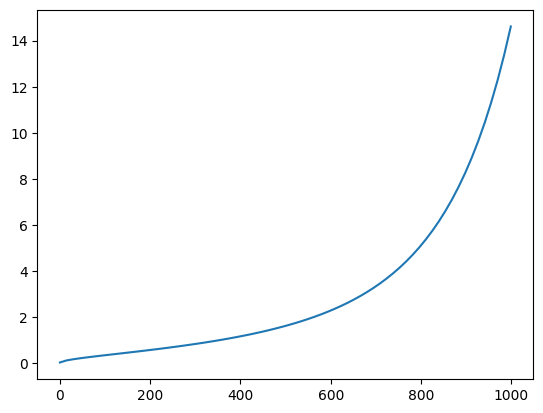

In [29]:
plt.plot(scheduler.timesteps, scheduler.sigmas[:-1]);

In [30]:
memuse()

| ID | GPU | MEM |
------------------
|  0 |  0% | 15% |
|  1 |  0% |  0% |


In [31]:
for i, t in enumerate(tqdm(scheduler.timesteps)):
    input = torch.cat([latents] * 2)
    input = scheduler.scale_model_input(input, t)

    with torch.no_grad(): pred = unet(input, t, encoder_hidden_states=text_embeddings).sample

    pred_uncond, pred_text = pred.chunk(2)
    pred = pred_uncond + guidance_scale * (pred_text - pred_uncond)

    latents = scheduler.step(pred, t, latents).prev_sample

  0%|          | 0/70 [00:00<?, ?it/s]

In [32]:
with torch.no_grad(): image = vae.decode(1 / 0.18215 * latents).sample #further adjustment after passing through the KLMS
type(image)

torch.Tensor

converting the image to PIL so we can display it, remember to cast it back to uint8 as float(0,1) isn't supported by PIL

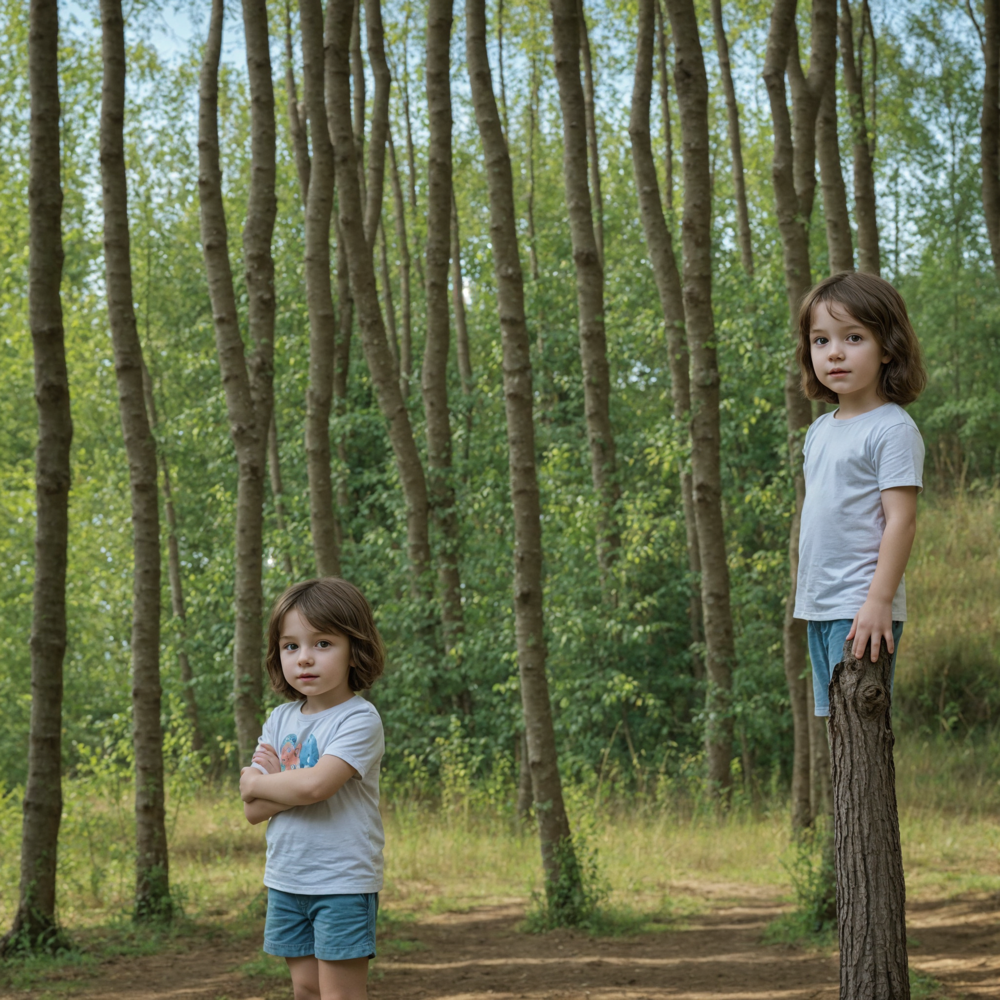

In [33]:

image = (image / 2 + 0.5).clamp(0, 1)
image = image[0].detach().cpu().permute(1, 2, 0).numpy()
image = (image * 255).round().astype("uint8")
Image.fromarray(image)

# type(image)